# ASAP Human Postmortem-Derived Brain Sequencing Collection (PMDBS): Data Overview 

Aligning Science Across Parkinson’s (ASAP), The Michael J. Fox Foundation for Parkinson’s Research (MJFF), and the Allen Institute for Brain Science (AIBS) are teaming up to further the mission of the ASAP Collaborative Research Network (CRN) program, to accelerate discoveries in the Parkinson’s disease (PD) and neurodegenerative disease research communities. Together we will annotate, enhance and add knowledge to the growing data catalog in the ASAP CRN Cloud through integration of cell type taxonomies using the Allen Institute’s MapMyCells tool and visualization through the Allen Brain Cell (ABC) Atlas web application. This integration of data and knowledge will allow users to visualize and explore the changes in gene expression of specific, highly resolved brain cell types in the context of a large PD cohort of donors.

This initial collaboration focuses on the Human Postmortem-derived Brain Sequencing Collection (PMDBS), a harmonized repository comprised of single nucleus and PolyA RNA-seq data contributed by five ASAP CRN teams (Hafler, Lee, Jakobsson, Scherzer, Hardy). Sequencing data were uniformly aligned to the GRCh38.p13 reference genome (Gencode V32), quality control was performed and low-quality cells were filtered out. A set of highly variable genes were identified and the scVI workflow resulted in an integrated latent variable representation, 2D UMAP coordinates and a set of 30 clusters. Currently, the repository spans roughly 3 millions cells obtained from 9 brain regions and 211 donors with various pathologies (including healthy control). For more details the specific version of the dataset we use here, please see [ASAP CRN Cloud Release v2.0.0](https://zenodo.org/records/14270014).

In this notebook we assemble the metadata associated with individual cells derived from donor, sample and data integration process information.

You need to be connected to the internet to run this notebook and should have run through the [getting started notebook](https://alleninstitute.github.io/abc_atlas_access/notebooks/getting_started.html).

In [1]:
import anndata
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from pathlib import Path

from abc_atlas_access.abc_atlas_cache.abc_project_cache import AbcProjectCache

We will interact with the data using the AbcProjectCache. This cache object tracks which data has been downloaded and serves the path to the requested data on disk. For metadata, the cache can also directly serve up a Pandas DataFrame.  See the [getting started notebook](https://alleninstitute.github.io/abc_atlas_access/notebooks/getting_started.html) notebook for more details on using the cache including installing it if it has not already been.

Change the download_base variable to where you have downloaded the data in your system.

In [2]:
download_base = Path('../../data/abc_atlas')
abc_cache = AbcProjectCache.from_cache_dir(download_base)

abc_cache.current_manifest

'releases/20250531/manifest.json'

## Data Overview

### ASAP Data

We simplify the ASAP-PMDB metadata into a single cell_metadata.csv file and companion tables describing the donor (including sex, age, race, disease state etc.), sample (including data processing metadata, team information, and region of interest from which the sample was dissected from), and value_sets.csv which provides a mapping from unique terms to their plotting color and term order. 

We'll first load the cell metadata. This provides the UMAP x, y coordinates and clusters provided by ASAP. Refer to the collection documentation for description of the data processing and source datasets.

In [3]:
cell_metadata = abc_cache.get_metadata_dataframe(
    directory='ASAP-PMDBS-10X',
    file_name='cell_metadata'
).set_index('cell_label')
print("Number of cells = ", len(cell_metadata))
cell_metadata.head()

cell_metadata.csv: 100%|██████████| 555M/555M [01:01<00:00, 9.09MMB/s] 


Number of cells =  2796736


,cell_barcode,sample_label,x,y,cluster_label,cluster_label_order,cluster_label_color,dataset_label,feature_matrix_label,abc_sample_id
cell_label,,,,,,,,,,
AAACCCAAGAAACCAT-1_ASAP_PMBDS_000060_s002_Rep1,AAACCCAAGAAACCAT-1,ASAP_PMBDS_000060_s002,0.016373,1.403025,cluster_000,1,#171c97,ASAP-PMDBS-10X,ASAP-PMDBS-10X,cc633260-614c-4e5c-aa18-d3e3a0ef81bb
AAACCCAAGAAACTCA-1_ASAP_PMBDS_000088_s001_Rep1,AAACCCAAGAAACTCA-1,ASAP_PMBDS_000088_s001,10.029368,1.342043,cluster_013,14,#aa5ed0,ASAP-PMDBS-10X,ASAP-PMDBS-10X,4b4f4355-6463-4bf2-9544-3f6d493de741
AAACCCAAGAAAGCGA-1_ASAP_PMBDS_000177_s001_rep1,AAACCCAAGAAAGCGA-1,ASAP_PMBDS_000177_s001,-9.057206,-1.032092,cluster_006,7,#f591a5,ASAP-PMDBS-10X,ASAP-PMDBS-10X,0ea675f3-4b39-4c16-9518-66ddd9c409a1
AAACCCAAGAAAGCGA-1_ASAP_PMBDS_000185_s001_rep1,AAACCCAAGAAAGCGA-1,ASAP_PMBDS_000185_s001,-0.685645,-4.943793,cluster_001,2,#e4a9ba,ASAP-PMDBS-10X,ASAP-PMDBS-10X,0eb0506b-e76b-4f9a-a3b6-bc6bbccfdd32
AAACCCAAGAAATCCA-1_ASAP_PMBDS_000122_s002_1,AAACCCAAGAAATCCA-1,ASAP_PMBDS_000122_s002,-3.507261,13.855699,cluster_002,3,#a02226,ASAP-PMDBS-10X,ASAP-PMDBS-10X,1f67fc2a-7e81-4448-8437-e2c6ef8b4b1b


We can use pandas groupby function to see how many unique items are associated for each field and list them out if the number of items is small.

In [4]:
def print_column_info(df):
    
    for c in df.columns:
        grouped = df[[c]].groupby(c).count()
        members = ''
        if len(grouped) < 30:
            members = str(list(grouped.index))
        print("Number of unique %s = %d %s" % (c, len(grouped), members))

In [5]:
print_column_info(cell_metadata)

Number of unique cell_barcode = 2040051 
Number of unique sample_label = 383 
Number of unique x = 2735345 
Number of unique y = 2711023 
Number of unique cluster_label = 30 
Number of unique cluster_label_order = 30 
Number of unique cluster_label_color = 30 
Number of unique dataset_label = 1 ['ASAP-PMDBS-10X']
Number of unique feature_matrix_label = 1 ['ASAP-PMDBS-10X']
Number of unique abc_sample_id = 2796736 


Nex we'll load and join the sample metadata. This contains information about the individual tissue samples that make up the combined dataset. This includes which ASAP Team collected and processed the cells, the technique used to measure the gene expression, and the region of interest in the brain the sample came from. The sample table is a version of the Sample metadata shown [here](https://cloud.parkinsonsroadmap.org/collections/postmortem-derived-brain-sequencing-collection/overview) with some post processing to disambiguate the data.

In [6]:
sample = abc_cache.get_metadata_dataframe(
    directory='ASAP-PMDBS-10X',
    file_name='sample'
).set_index('sample_label')
sample.head()

sample.csv: 100%|██████████| 50.1k/50.1k [00:00<00:00, 547kMB/s]


,donor_label,source_dataset_label,source_dataset_label_order,source_dataset_label_color,technique,technique_order,technique_color,region_of_interest_label,region_of_interest_label_order,region_of_interest_label_color
sample_label,,,,,,,,,,
ASAP_PMBDS_000001_s001,ASAP_PMBDS_000001,team_lee_sn_rnaseq,1,#e41a1c,v1,1,#03738C,hippocampus,6,#bfb5d5
ASAP_PMBDS_000001_s002,ASAP_PMBDS_000001,team_lee_sn_rnaseq,1,#e41a1c,v1,1,#03738C,middle frontal gyrus,1,#d4b235
ASAP_PMBDS_000001_s003,ASAP_PMBDS_000001,team_lee_sn_rnaseq,1,#e41a1c,v1,1,#03738C,substantia nigra,9,#6ca9bf
ASAP_PMBDS_000002_s001,ASAP_PMBDS_000002,team_lee_sn_rnaseq,1,#e41a1c,v1,1,#03738C,hippocampus,6,#bfb5d5
ASAP_PMBDS_000002_s002,ASAP_PMBDS_000002,team_lee_sn_rnaseq,1,#e41a1c,v1,1,#03738C,middle frontal gyrus,1,#d4b235


We join the sample information into the full cell metadata table.

In [7]:
cell_metadata = cell_metadata.join(sample, on='sample_label')

Next, we load the donor table. This contains information on the donors (age, sex, race, pathology, etc.) that make up the study and is a processed copy of the Donor table from the same ASAP data description page linked above.

In [8]:
donor = abc_cache.get_metadata_dataframe(
    directory='ASAP-PMDBS-10X',
    file_name='donor'
).set_index('donor_label')
donor.head()

donor.csv: 100%|██████████| 50.3k/50.3k [00:00<00:00, 623kMB/s]


,donor_race,donor_race_order,donor_race_color,donor_sex,donor_sex_order,donor_sex_color,primary_diagnosis,primary_diagnosis_order,primary_diagnosis_color,age_at_death,...,cerad_score_color,cognitive_status,cognitive_status_order,cognitive_status_color,lewy_body_disease_pathology,lewy_body_disease_pathology_order,lewy_body_disease_pathology_color,thal_phase,thal_phase_order,thal_phase_color
donor_label,,,,,,,,,,,,,,,,,,,,,
ASAP_PMBDS_000001,White,2,#38CAE8,Male,2,#ADC4C3,No PD nor other neurological disorder,2,#99d594,78 - 89 yrs,...,#e8e8e8,Normal,1,#4daf4a,Olfactory bulb only,2,#edf8b1,Unknown,8,#e8e8e8
ASAP_PMBDS_000002,White,2,#38CAE8,Male,2,#ADC4C3,Other neurological disorder,3,#e6f598,78 - 89 yrs,...,#e8e8e8,Normal,1,#4daf4a,Brainstem predominant,4,#7fcdbb,Thal 0,1,#f1eef6
ASAP_PMBDS_000003,White,2,#38CAE8,Male,2,#ADC4C3,Idiopathic Parkinson's disease,7,#d53e4f,< 65 yrs,...,#e8e8e8,Mild Cognitive Impairment,2,#377eb8,Limbic (transitional),7,#225ea8,Thal 0,1,#f1eef6
ASAP_PMBDS_000004,White,2,#38CAE8,Male,2,#ADC4C3,Idiopathic Parkinson's disease,7,#d53e4f,78 - 89 yrs,...,#e8e8e8,Mild Cognitive Impairment,2,#377eb8,Neocortical,8,#253494,Unknown,8,#e8e8e8
ASAP_PMBDS_000005,White,2,#38CAE8,Male,2,#ADC4C3,Idiopathic Parkinson's disease,7,#d53e4f,78 - 89 yrs,...,#4daf4a,Normal,1,#4daf4a,Neocortical,8,#253494,Unknown,8,#e8e8e8


In [9]:
cell_metadata = cell_metadata.join(donor, on='donor_label')

Let's print out information on our final table.

In [10]:
print_column_info(cell_metadata)

Number of unique cell_barcode = 2040051 
Number of unique sample_label = 383 
Number of unique x = 2735345 
Number of unique y = 2711023 
Number of unique cluster_label = 30 
Number of unique cluster_label_order = 30 
Number of unique cluster_label_color = 30 
Number of unique dataset_label = 1 ['ASAP-PMDBS-10X']
Number of unique feature_matrix_label = 1 ['ASAP-PMDBS-10X']
Number of unique abc_sample_id = 2796736 
Number of unique donor_label = 211 
Number of unique source_dataset_label = 5 ['team_hafler_sn_rnaseq_pfc', 'team_hardy_sn_rnaseq', 'team_jakobsson_sn_rnaseq', 'team_lee_sn_rnaseq', 'team_scherzer_sn_rnaseq_mtg']
Number of unique source_dataset_label_order = 5 [1, 2, 3, 4, 5]
Number of unique source_dataset_label_color = 5 ['#377eb8', '#4daf4a', '#984ea3', '#e41a1c', '#ff7f00']
Number of unique technique = 3 ['v1', 'v3.1 - Dual Index', 'v3.1 - Single Index']
Number of unique technique_order = 3 [1, 2, 3]
Number of unique technique_color = 3 ['#03738C', '#F27329', '#F2B591']
N

Finally, we'll load the value_sets table. This is mainly a mapping between the different sets of terms (e.g. regions of interest, cell types, age ranges), providing unique colors for each term in a set and an order of the set. We'll primarily use it as a lookup table to order or different terms in plot legends. 

In [11]:
value_sets = abc_cache.get_metadata_dataframe(
    directory='ASAP-PMDBS-10X',
    file_name='value_sets'
).set_index('label')
value_sets.head()

value_sets.csv: 100%|██████████| 4.25k/4.25k [00:00<00:00, 68.6kMB/s]


,field,order,color_hex_triplet
label,,,
v1,technique,1,#03738C
v3.1 - Dual Index,technique,3,#F27329
v3.1 - Single Index,technique,2,#F2B591
cluster_000,cluster_label,1,#171c97
cluster_001,cluster_label,2,#e4a9ba


## UMAP Plotting

We define convenience function to plot the Uniform Manifold Approximation and Projection (UMAP) of the ASAP PMDB data.

In [12]:
def plot_umap(
    xx,
    yy,
    cc=None,
    val=None,
    fig_width=8,
    fig_height=8,
    cmap=None,
    labels=None,
    term_order_lookup=None,
    colorbar=False,
    sizes=None
):
    """
    """
    if sizes is None:
        sizes = 1
    fig, ax = plt.subplots()
    fig.set_size_inches(fig_width, fig_height)

    if cmap is not None:
        scatt = ax.scatter(xx, yy, c=val, s=0.5, marker='.', cmap=cmap, alpha=sizes)
    elif cc is not None:
        scatt = ax.scatter(xx, yy, c=cc, s=0.5, marker='.', alpha=sizes)

    if labels is not None:
        from matplotlib.patches import Rectangle
        unique_labels = labels.unique()
        unique_colors = cc.unique()

        if term_order_lookup is not None:
            term_order = np.argsort(term_order_lookup.loc[unique_labels, 'order'])
            unique_labels = unique_labels[term_order]
            unique_colors = unique_colors[term_order]
            
        rects = []
        for color in unique_colors:
            rects.append(Rectangle((0, 0), 1, 1, fc=color))

        legend = ax.legend(rects, unique_labels, loc=0)
        # ax.add_artist(legend)

    if colorbar:
        fig.colorbar(scatt, ax=ax)
    
    return fig, ax

### Data Acquisition Metadata

Below we plot various information associated with the collection of the data. This includes which of the five teams collected the data, the 10X chemistry version used, and the region of interest the tissue was extracted from. Note, throughout the presentation of these data, that some values are missing for collections of cells. This is due to the value not being present for these cells and samples in the data. These are marked as `Unknown`.

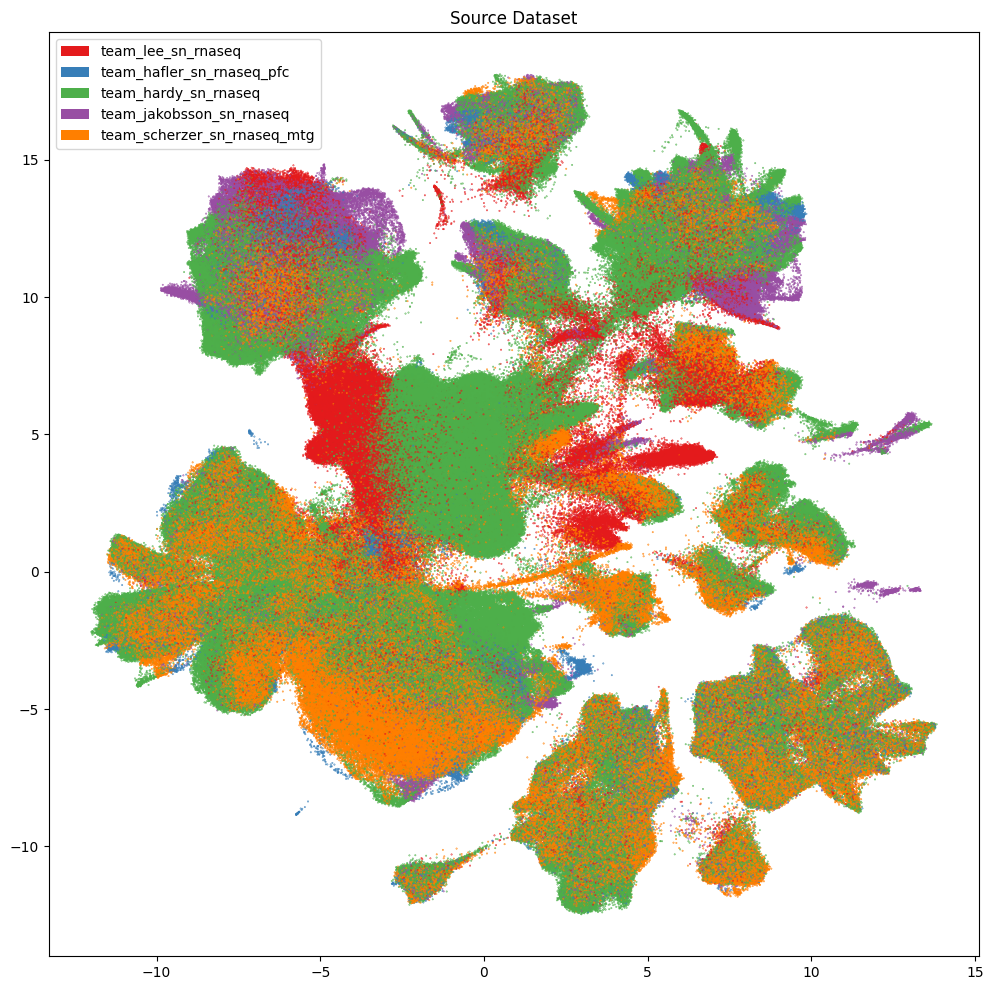

In [13]:
fig, ax = plot_umap(
    cell_metadata['x'],
    cell_metadata['y'],
    cc=cell_metadata['source_dataset_label_color'],
    labels=cell_metadata['source_dataset_label'],
    term_order_lookup=value_sets,
    fig_width=12,
    fig_height=12
)
res = ax.set_title("Source Dataset")
plt.show()

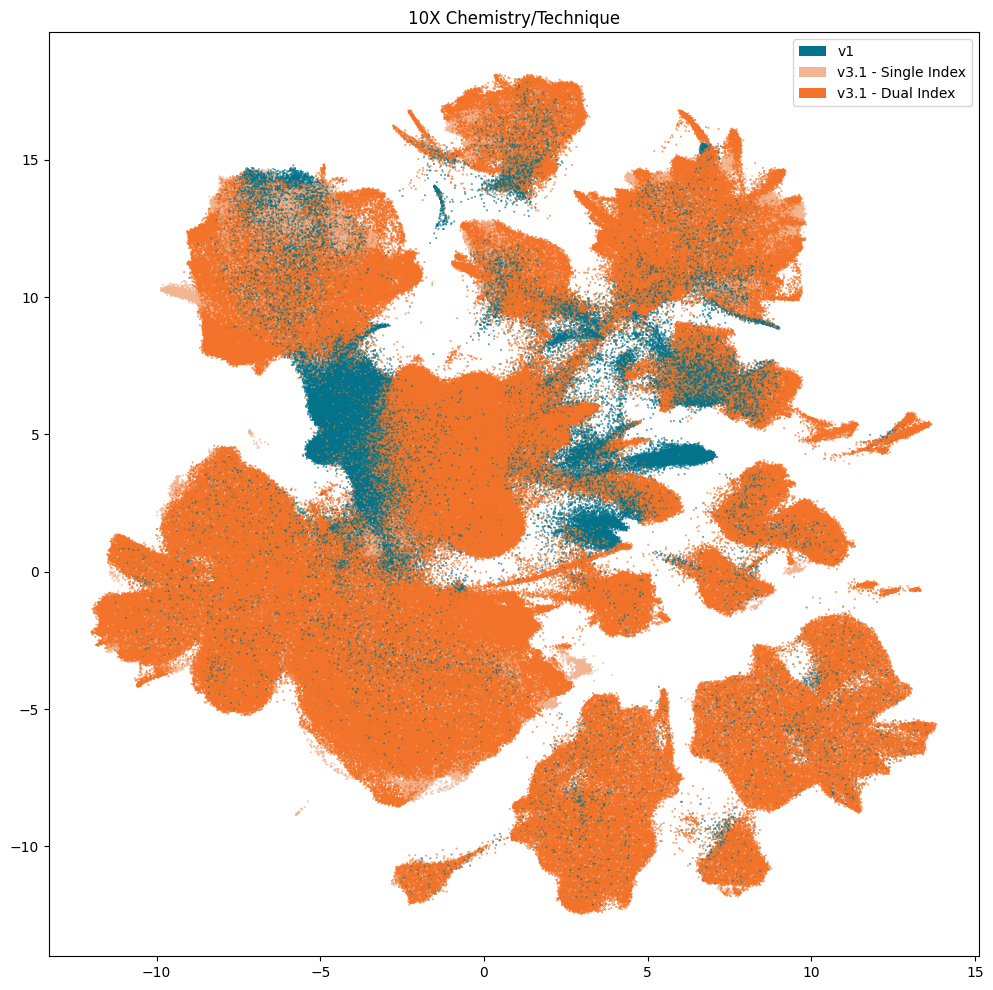

In [14]:
fig, ax = plot_umap(
    cell_metadata['x'],
    cell_metadata['y'],
    cc=cell_metadata['technique_color'],
    labels=cell_metadata['technique'],
    term_order_lookup=value_sets,
    fig_width=12,
    fig_height=12
)
res = ax.set_title("10X Chemistry/Technique")
plt.show()

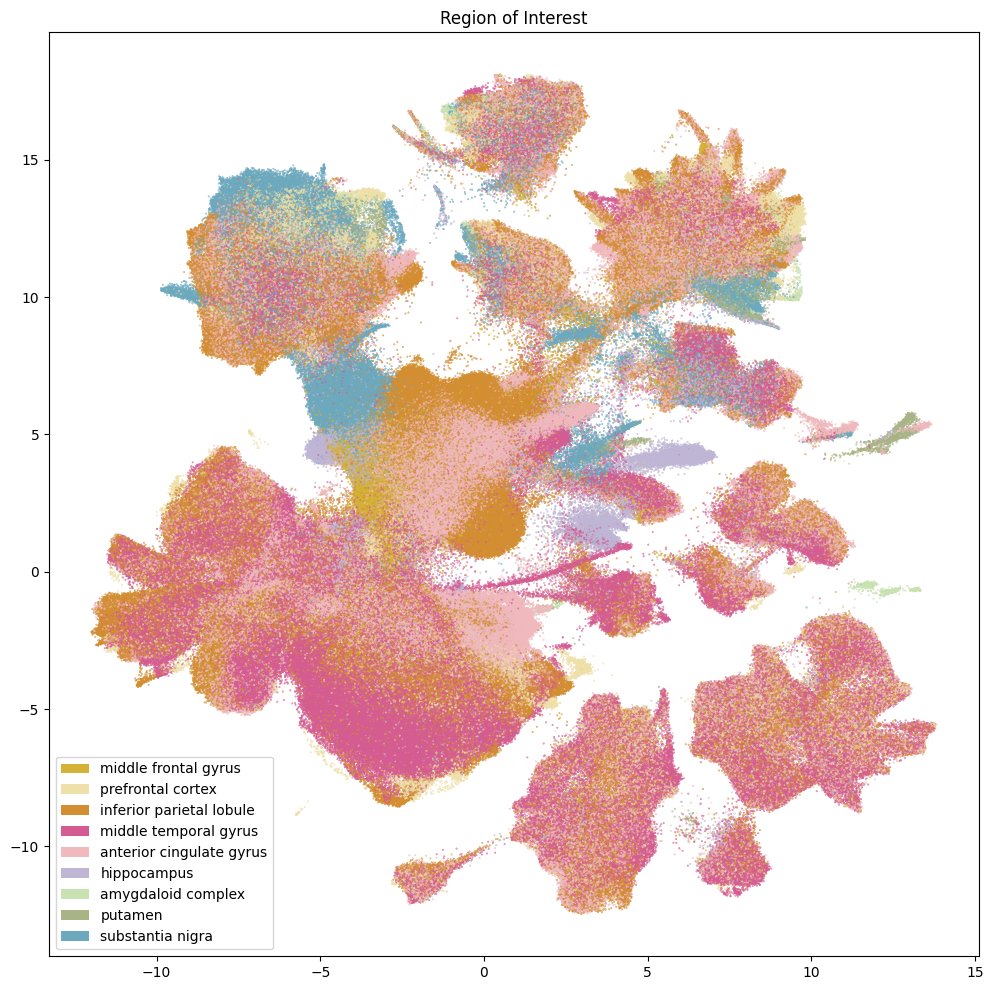

In [15]:
fig, ax = plot_umap(
    cell_metadata['x'],
    cell_metadata['y'],
    cc=cell_metadata['region_of_interest_label_color'],
    labels=cell_metadata['region_of_interest_label'],
    term_order_lookup=value_sets,
    fig_width=12,
    fig_height=12
)
res = ax.set_title("Region of Interest")
plt.show()

### Donor Metadata

Below we plot various information on the donor where these samples/cells originated.

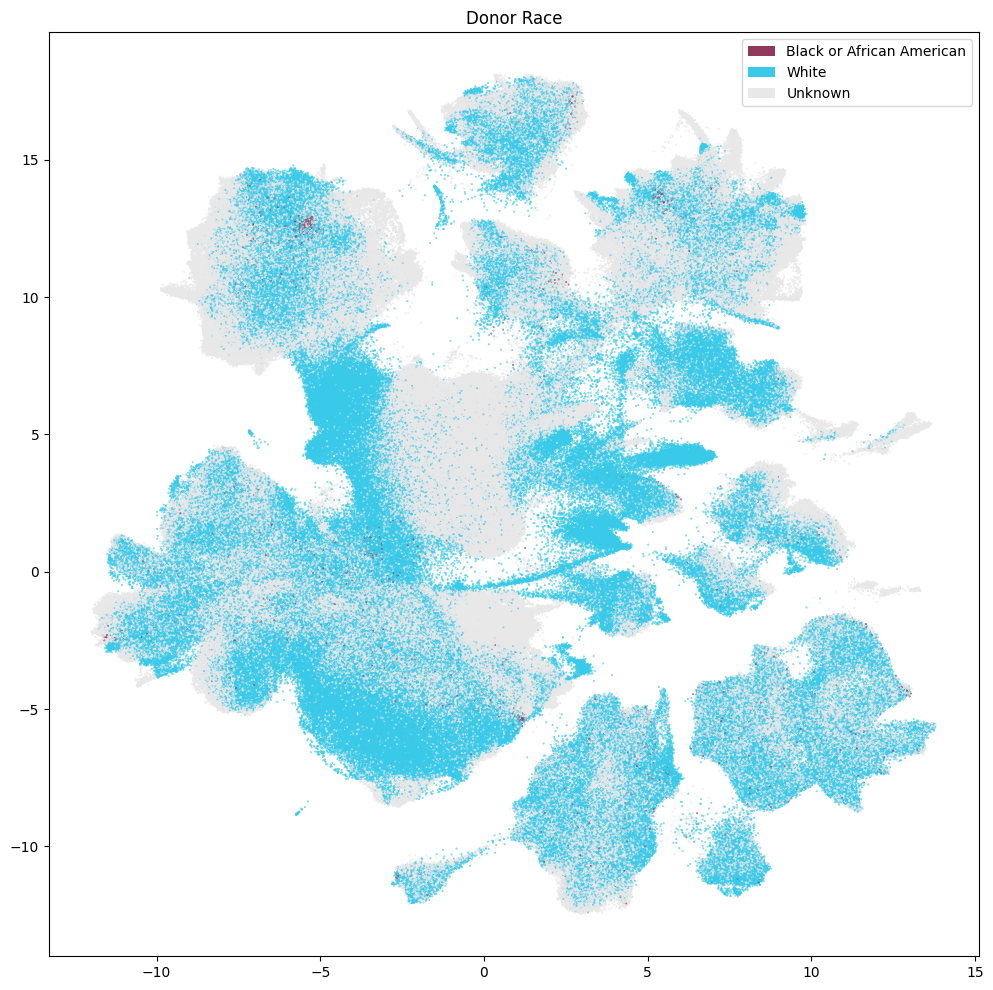

In [16]:
fig, ax = plot_umap(
    cell_metadata['x'],
    cell_metadata['y'],
    cc=cell_metadata['donor_race_color'],
    labels=cell_metadata['donor_race'],
    term_order_lookup=value_sets[value_sets['field'] == 'donor_race'],
    fig_width=12,
    fig_height=12
)
res = ax.set_title("Donor Race")
plt.show()

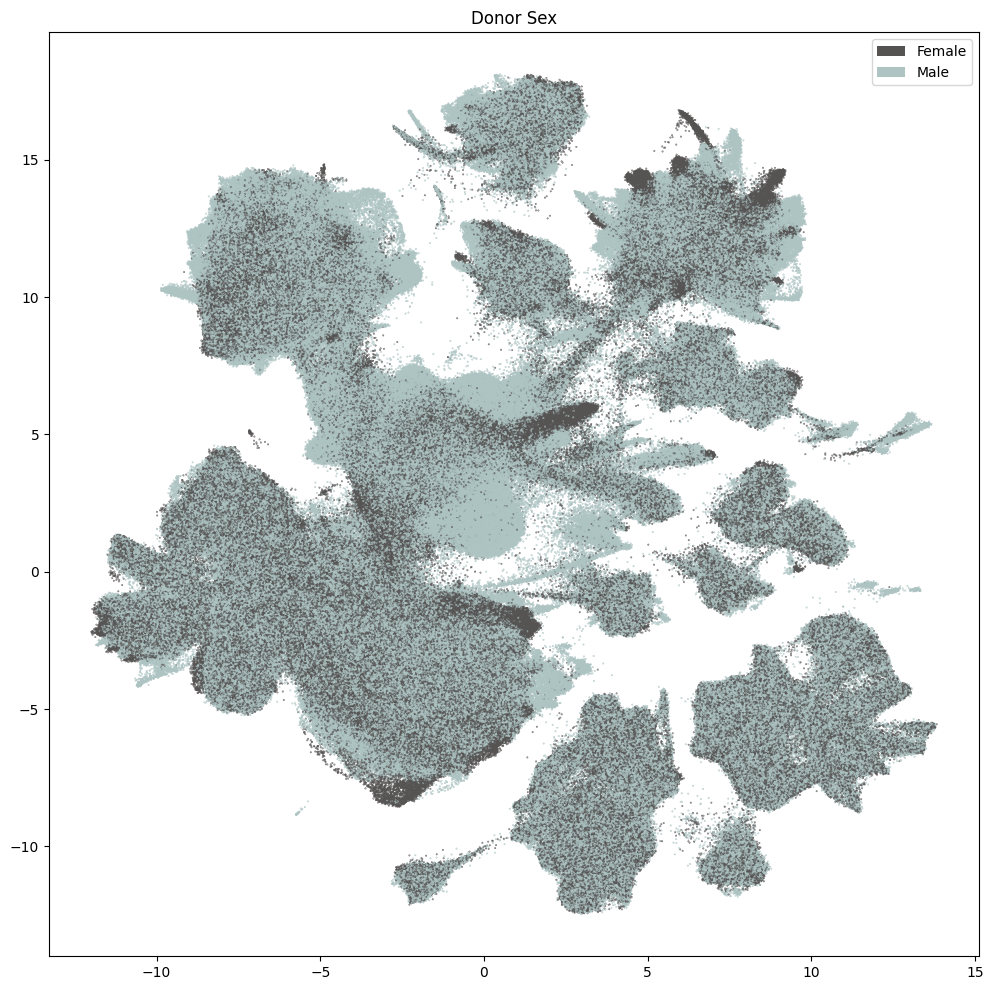

In [17]:
fig, ax = plot_umap(
    cell_metadata['x'],
    cell_metadata['y'],
    cc=cell_metadata['donor_sex_color'],
    labels=cell_metadata['donor_sex'],
    term_order_lookup=value_sets[value_sets['field'] == 'donor_sex'],
    fig_width=12,
    fig_height=12
)
res = ax.set_title("Donor Sex")
plt.show()

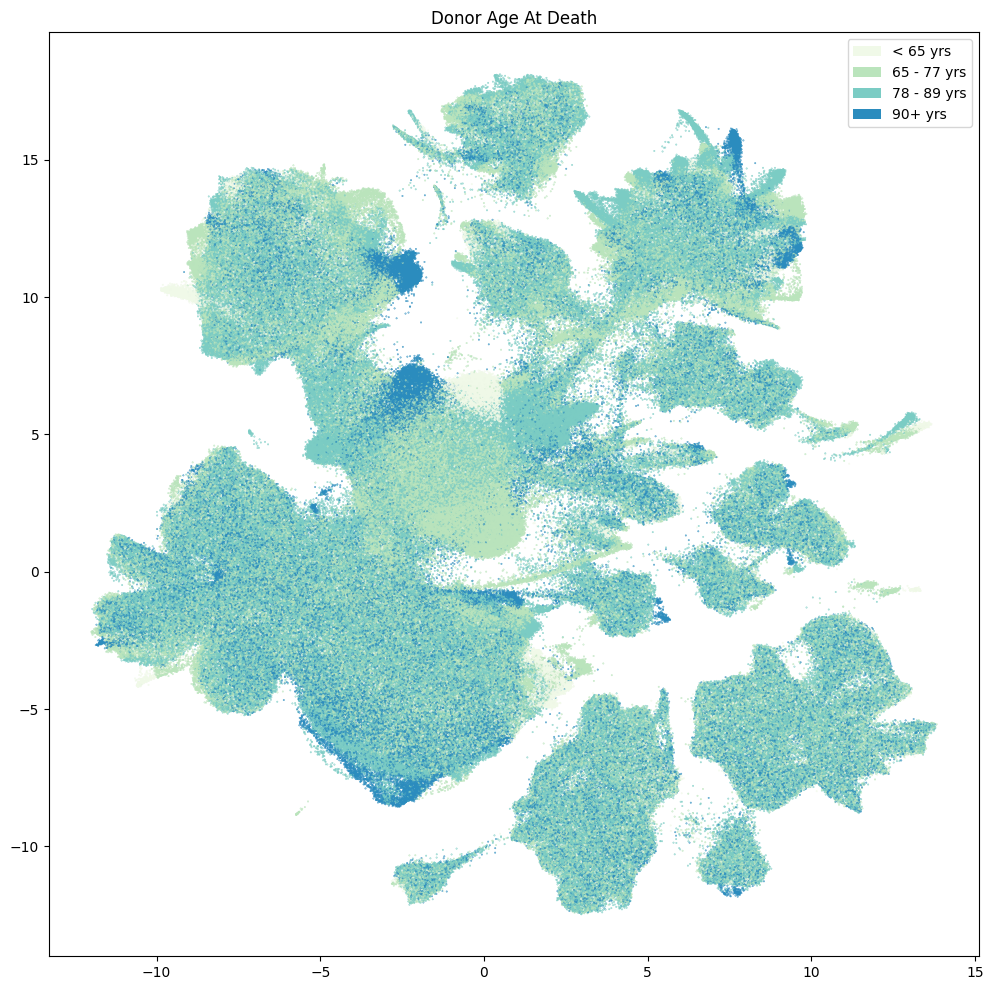

In [18]:
fig, ax = plot_umap(
    cell_metadata['x'],
    cell_metadata['y'],
    cc=cell_metadata['age_at_death_color'],
    labels=cell_metadata['age_at_death'],
    term_order_lookup=value_sets[value_sets['field'] == 'age_at_death'],
    fig_width=12,
    fig_height=12
)
res = ax.set_title("Donor Age At Death")
plt.show()

### Clinical  Pathology

Below are various diagnoses and pathologies identified in the donor including healthy controls.

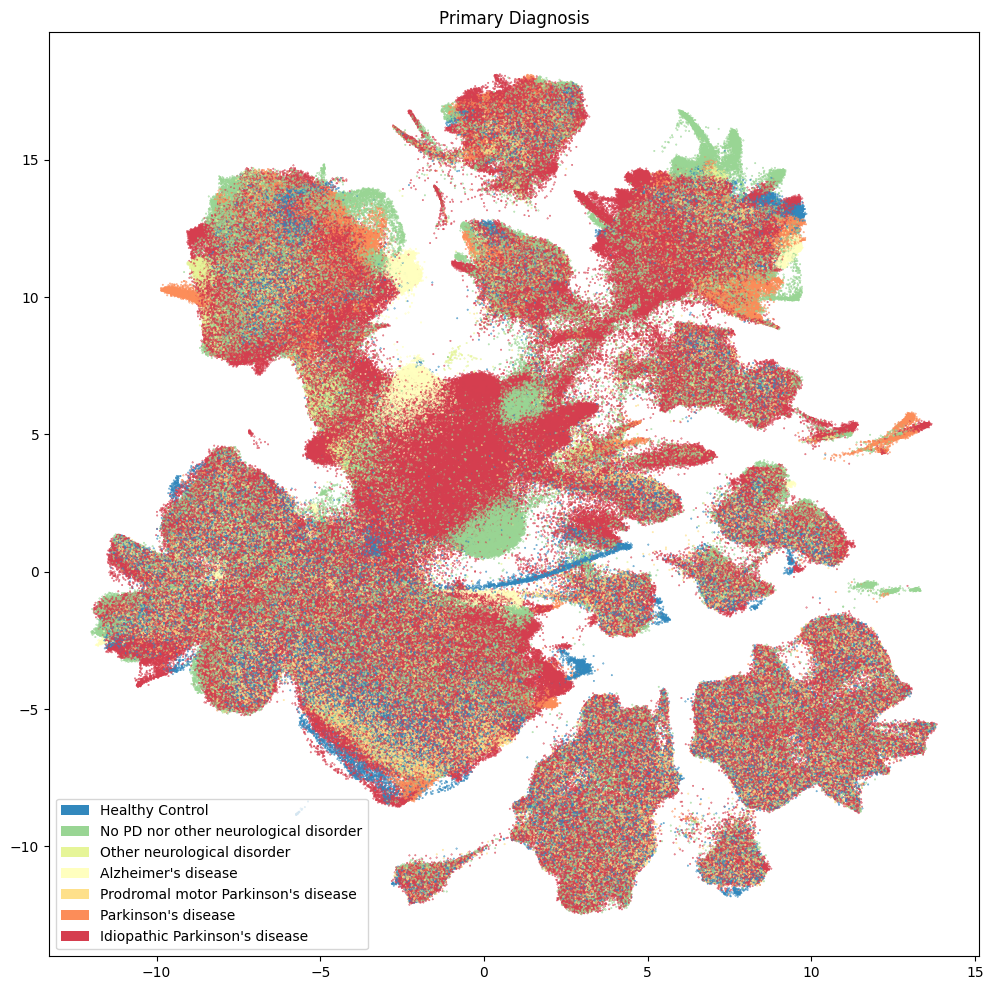

In [19]:
fig, ax = plot_umap(
    cell_metadata['x'],
    cell_metadata['y'],
    cc=cell_metadata['primary_diagnosis_color'],
    labels=cell_metadata['primary_diagnosis'],
    term_order_lookup=value_sets[value_sets['field'] == 'primary_diagnosis'],
    fig_width=12,
    fig_height=12
)
res = ax.set_title("Primary Diagnosis")
plt.show()

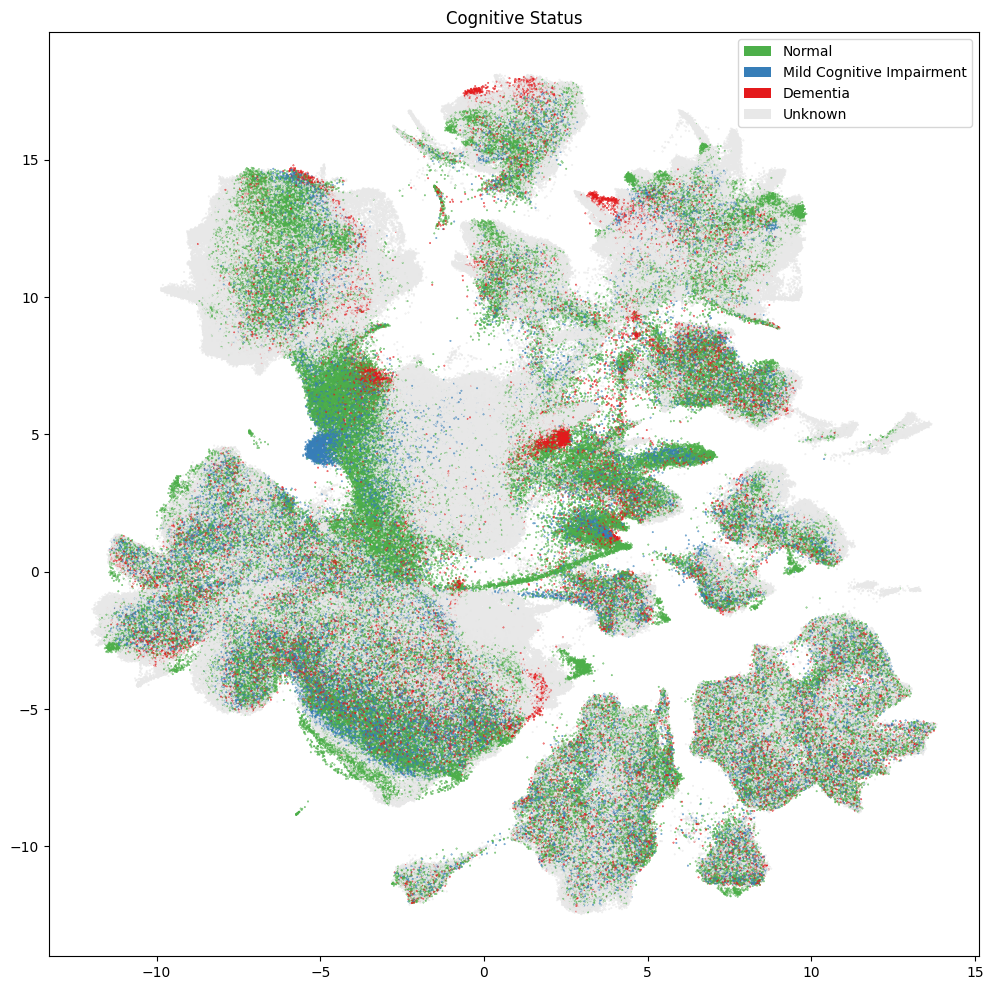

In [20]:
fig, ax = plot_umap(
    cell_metadata['x'],
    cell_metadata['y'],
    cc=cell_metadata['cognitive_status_color'],
    labels=cell_metadata['cognitive_status'],
    term_order_lookup=value_sets[value_sets['field'] == 'cognitive_status'],
    fig_width=12,
    fig_height=12
)
res = ax.set_title("Cognitive Status")
plt.show()

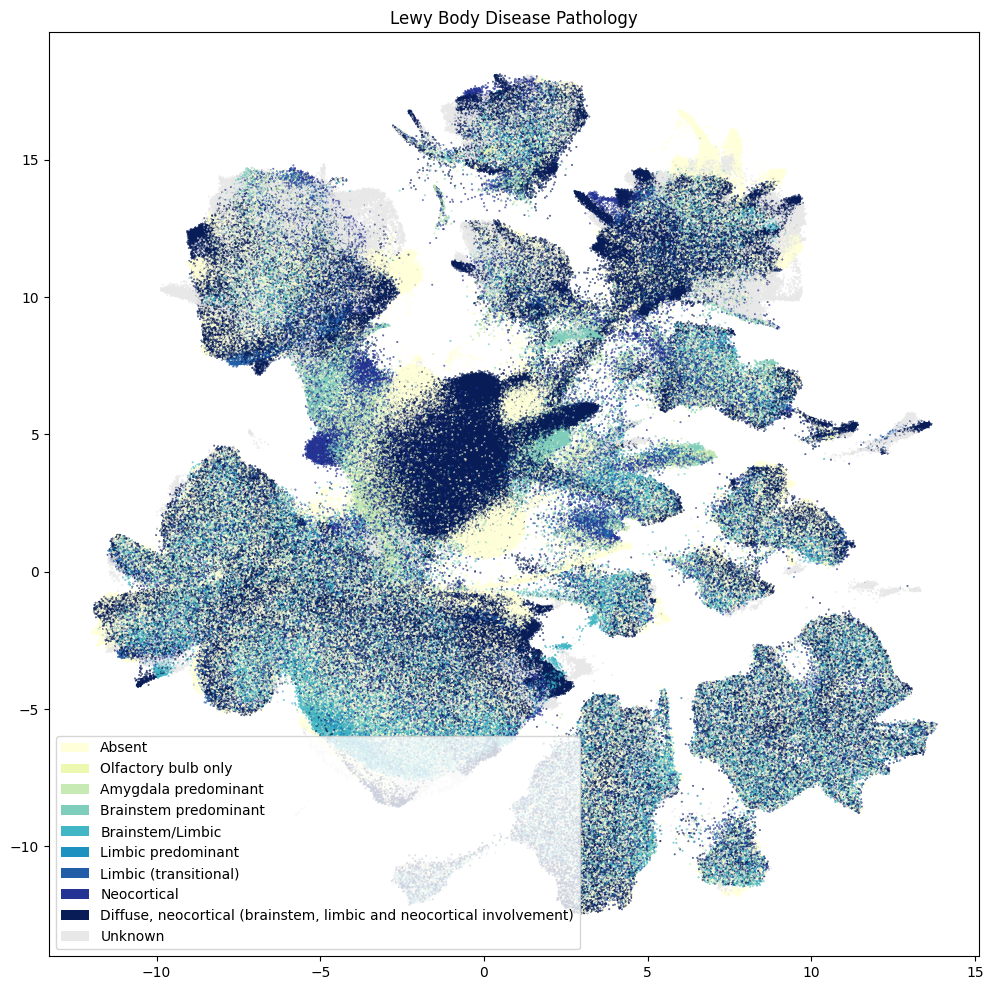

In [21]:
fig, ax = plot_umap(
    cell_metadata['x'],
    cell_metadata['y'],
    cc=cell_metadata['lewy_body_disease_pathology_color'],
    labels=cell_metadata['lewy_body_disease_pathology'],
    term_order_lookup=value_sets[value_sets['field'] == 'lewy_body_disease_pathology'],
    fig_width=12,
    fig_height=12
)
res = ax.set_title("Lewy Body Disease Pathology")
plt.show()

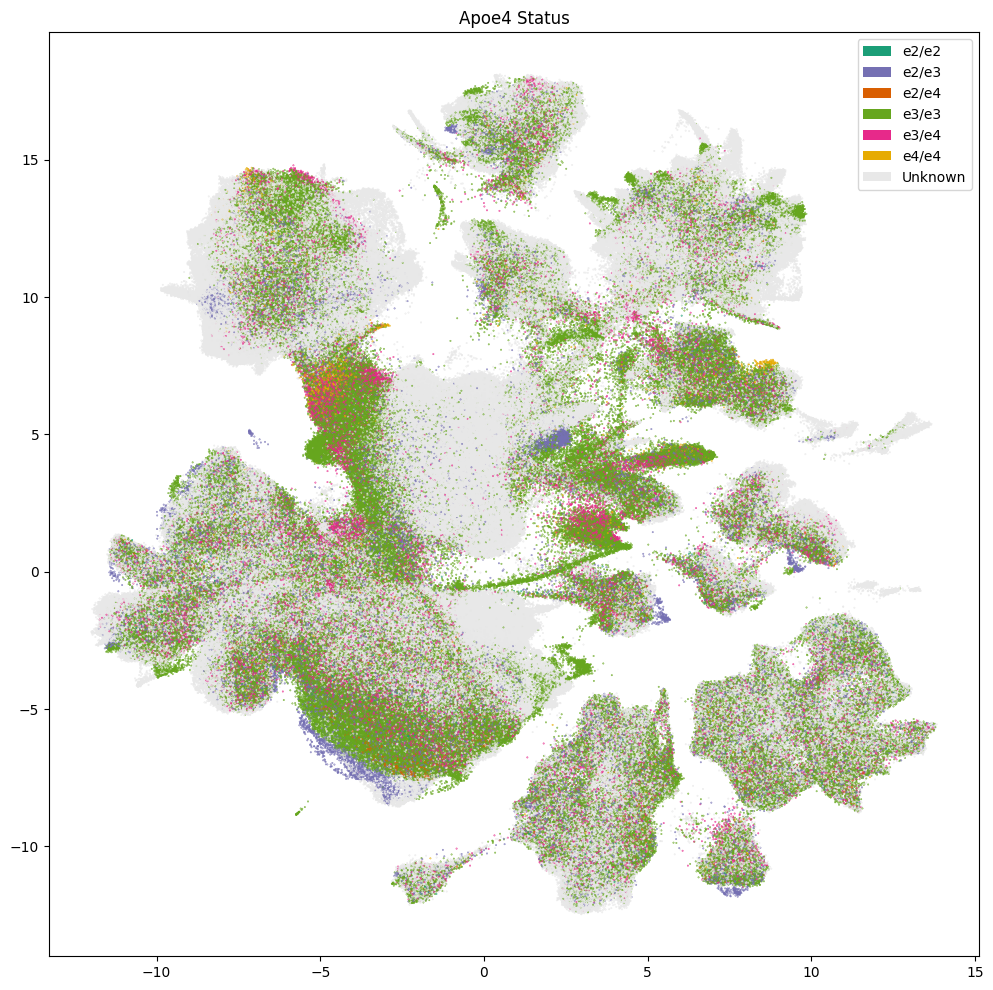

In [22]:
fig, ax = plot_umap(
    cell_metadata['x'],
    cell_metadata['y'],
    cc=cell_metadata['apoe4_status_color'],
    labels=cell_metadata['apoe4_status'],
    term_order_lookup=value_sets[value_sets['field'] == 'apoe4_status'],
    fig_width=12,
    fig_height=12
)
res = ax.set_title("Apoe4 Status")
plt.show()

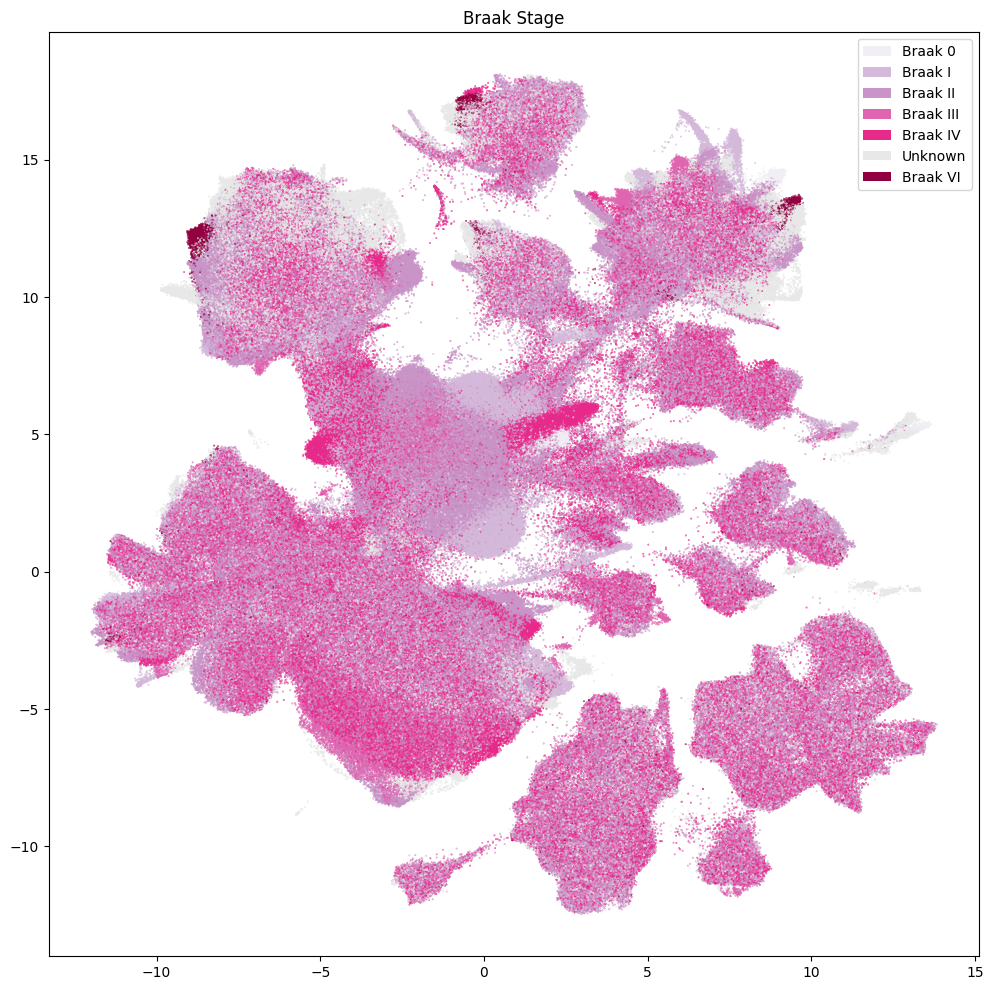

In [23]:
fig, ax = plot_umap(
    cell_metadata['x'],
    cell_metadata['y'],
    cc=cell_metadata['braak_stage_color'],
    labels=cell_metadata['braak_stage'],
    term_order_lookup=value_sets[value_sets['field'] == 'braak_stage'],
    fig_width=12,
    fig_height=12
)
res = ax.set_title("Braak Stage")
plt.show()

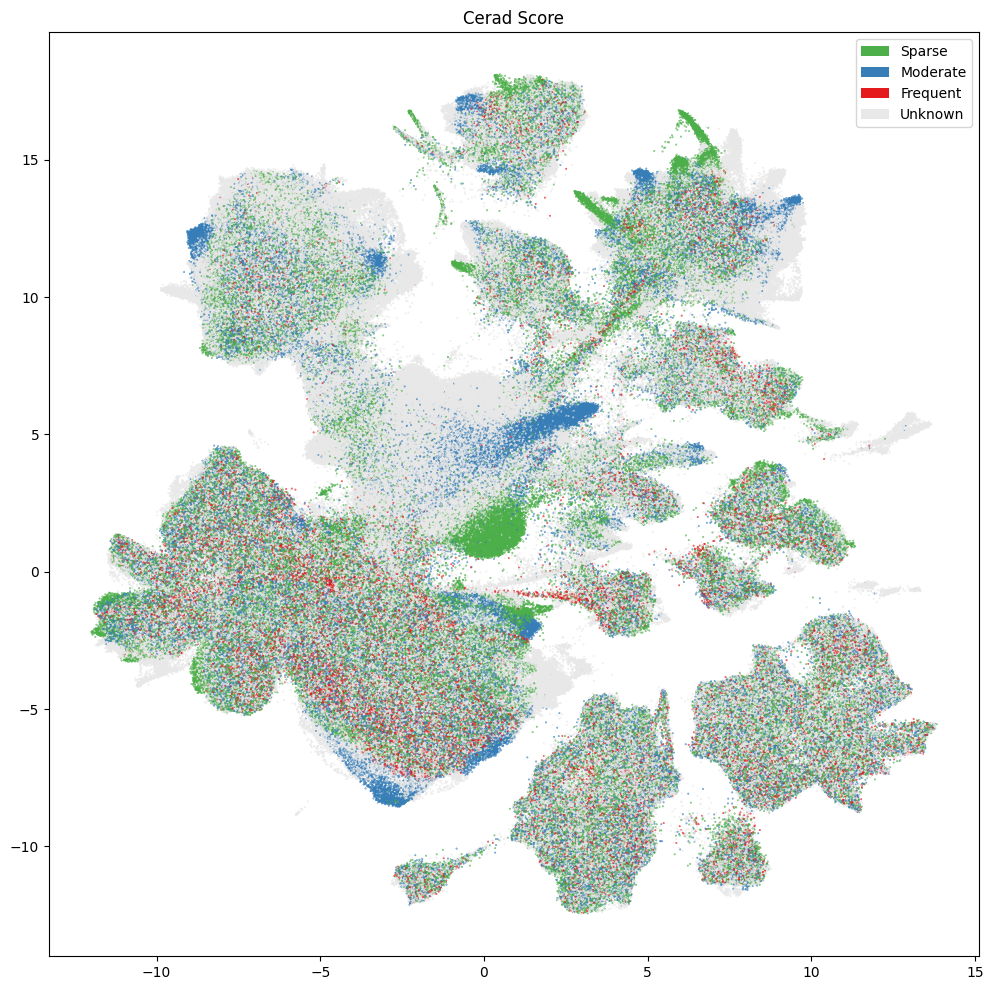

In [24]:
fig, ax = plot_umap(
    cell_metadata['x'],
    cell_metadata['y'],
    cc=cell_metadata['cerad_score_color'],
    labels=cell_metadata['cerad_score'],
    term_order_lookup=value_sets[value_sets['field'] == 'cerad_score'],
    fig_width=12,
    fig_height=12
)
res = ax.set_title("Cerad Score")
plt.show()

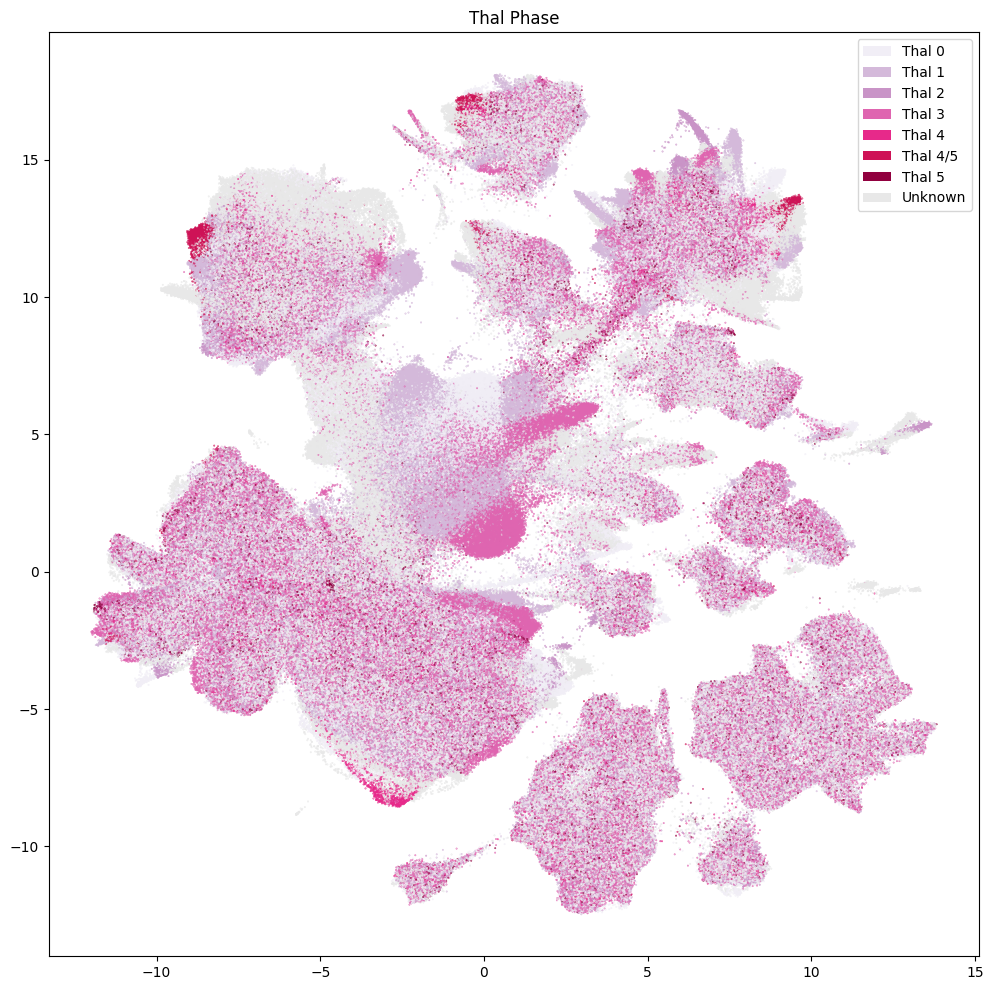

In [25]:
fig, ax = plot_umap(
    cell_metadata['x'],
    cell_metadata['y'],
    cc=cell_metadata['thal_phase_color'],
    labels=cell_metadata['thal_phase'],
    term_order_lookup=value_sets[value_sets['field'] == 'thal_phase'],
    fig_width=12,
    fig_height=12
)
res = ax.set_title("Thal Phase")
plt.show()

### Leiden scVI Clusters 

As part of the ASAP harmonization, scVI was used to generate a latent space representation, 2D UMAP coordinates and set of 30 clusters using their implementation of the Leiden algorithm. 

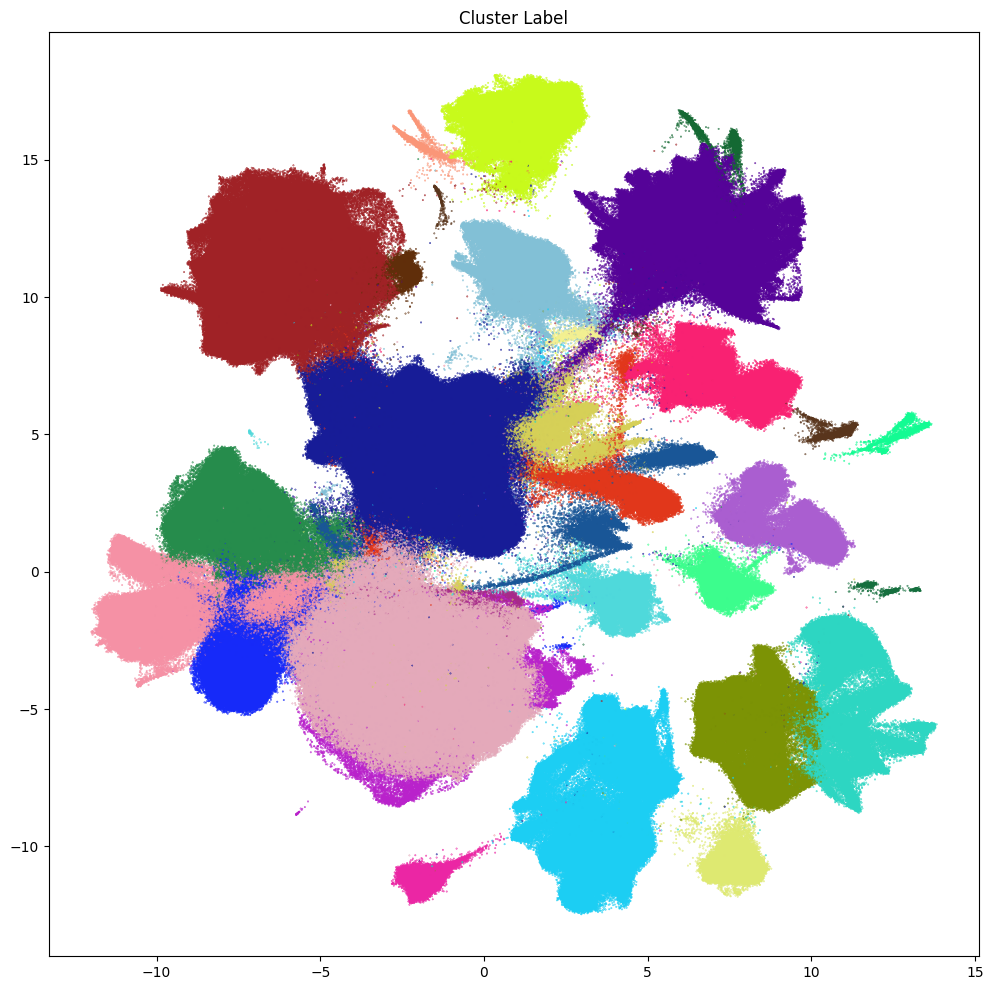

In [26]:
fig, ax = plot_umap(
    cell_metadata['x'],
    cell_metadata['y'],
    cc=cell_metadata['cluster_label_color'],
    fig_width=12,
    fig_height=12
)
res = ax.set_title("Cluster Label")
plt.show()

In the next [notebook](https://alleninstitute.github.io/abc_atlas_access/notebooks/asap_pmdbs_siletti_taxonomy.html), we demonstrate the usage of Allen Institute’s [MapMyCells](https://portal.brain-map.org/atlases-and-data/bkp/mapmycells) tool to map cells from the ASAP PMDBS dataset to the whole human brain taxonomy (Siletti et al.) to provide cell type annotation and insights to the Leiden scVI clusters above.

We'll also explore gene expression in the UMAP in a [later notebook](https://alleninstitute.github.io/abc_atlas_access/notebooks/asap_pmdbs_gene_expression.html).